# Install Ultralytics:
To run Yolo's Model on the Data you should have to install the Ultralytics package if Using 
virtual GPU like in Colab or kaggle just simply run the command.

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 877.7/877.7 kB 16.6 MB/s eta 0:00:00


# Import Necessary Packages:

In [2]:
import yaml
import os
import hashlib
import shutil
import json
import torch
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


# Issue with Data:
* While fitching classes it says it contain 36 classes from 0 to 35
* Some labeling are incorrect
* Out of 36 there is 11 classes which are in include in labels but have no correspond images

## **PREPROCESS DATA:**

*  **Explanation:** As we have issue of the classes in out dataset like having the labels of some classes but its corresponding images are not available in train/Val Dataset. According to index form out of 36 classes Data didn't include These Classes `[4,5,7,10,11,18,25,28,29,33,34]` , to resolve this issue we have to remove this labels and clean our Data so that it can run successfully by yolov5m Model. For acheiving this we did some procedure which are as follows;

## PROCEDURE:
1. **Filter Out Missing Classes:** Copy only the images and labels that do not contain the missing classes`[4, 5, 7, 10, 11, 18, 25, 28, 29, 33, 34]` to a new output directory.
2. **Re-map Class Indices:** Update the class indices in the label files to remove the gaps created by the missing classes. For example, if Class 4 is missing, Class 6 will become Class 4, and so on.
3. The `process_data` function takes some inputs and it filter out labels with missing  classes and copy the clean data from directory valid and train to the out directory as i did this code on `kaggle Notebook` so we can't do changes to input directory that's why i have to copy it to output kaggle directory. I already mentioned in the code if you are using another enviornment then just filter the data and use only clean data.


In [3]:
def process_data(input_labels_dir, input_images_dir, output_labels_dir, output_images_dir, missing_classes, remap_indices):
    """Process data by filtering out labels with missing classes and copying valid images and labels."""
    # Ensure output directories exist
    os.makedirs(output_labels_dir, exist_ok=True)
    os.makedirs(output_images_dir, exist_ok=True)

    # Process label files, remapping classes and copying valid files
    for label_file in os.listdir(input_labels_dir):
        if label_file.endswith('.txt'):
            label_path = os.path.join(input_labels_dir, label_file)
            new_lines = []
            valid_file = True

            # Read the label file and remap classes
            with open(label_path, 'r') as file:
                for line in file:
                    class_id = int(line.split()[0])

                    # Skip label files with missing classes
                    if class_id in missing_classes:
                        valid_file = False
                        break

                    # Remap the class ID to the new index
                    remapped_class_id = remap_indices[class_id]
                    new_line = line.replace(str(class_id), str(remapped_class_id), 1)
                    new_lines.append(new_line)

            # If the label file is valid, copy it and the corresponding image
            if valid_file:
                # Save the updated label file
                new_label_path = os.path.join(output_labels_dir, label_file)
                with open(new_label_path, 'w') as file:
                    file.writelines(new_lines)

                # Copy the corresponding image
                image_file = label_file.replace('.txt', '.jpg')  # Adjust if images have different extensions
                image_path = os.path.join(input_images_dir, image_file)
                if os.path.exists(image_path):
                    shutil.copy(image_path, output_images_dir)
                    print(f"Copied image and label: {image_file}")


### Initializing Paths:
You can adjust it according to your own paths to Data Set.


In [4]:
# Define directories for train and validation sets
train_labels_dir = '/kaggle/input/object-detection-of-26-objects/dataset_26/train/labels'  
train_images_dir = '/kaggle/input/object-detection-of-26-objects/dataset_26/train/images'
output_train_labels_dir = '/kaggle/working/filtered_dataset/train/labels'
output_train_images_dir = '/kaggle/working/filtered_dataset/train/images'

valid_labels_dir = '/kaggle/input/object-detection-of-26-objects/dataset_26/valid/labels'  
valid_images_dir = '/kaggle/input/object-detection-of-26-objects/dataset_26/valid/images'
output_valid_labels_dir = '/kaggle/working/filtered_dataset/valid/labels'
output_valid_images_dir = '/kaggle/working/filtered_dataset/valid/images'

### Remaping Classes:

In [5]:
# Define classes to exclude and initialize remapped classes
missing_classes = [4, 5, 7, 10, 11, 18, 25, 28, 29, 33, 34]
all_classes = list(range(36))  # Full range of classes from 0 to 35
present_classes = [cls for cls in all_classes if cls not in missing_classes]  # Classes that are present

# Define the final class names after excluding the missing classes
class_name_mapping = {
    0: 'Bus', 1: 'Bushes', 2: 'Person face', 3: 'Truck', 6: 'bicycle', 8: 'branch',
    9: 'Car', 12: 'Crosswalk', 13: 'Door', 14: 'Elevator', 15: 'fire hydrant',
    16: 'Green Light', 17: 'Gun', 19: 'Motorcycle', 20: 'person', 21: 'pothole',
    22: 'Rat', 23: 'Red Light', 24: 'scooter', 26: 'Stairs', 27: 'Stop Sign',
    30: 'Traffic cone', 31: 'Train', 32: 'Tree', 35: 'Yellow light'
}

### Calling Proccess Function:

In [6]:
# Create a remapped index for each present class
remap_indices = {old_index: new_index for new_index, old_index in enumerate(present_classes)}

# Process the train and validation datasets
process_data(train_labels_dir, train_images_dir, output_train_labels_dir, output_train_images_dir, missing_classes, remap_indices)
process_data(valid_labels_dir, valid_images_dir, output_valid_labels_dir, output_valid_images_dir, missing_classes, remap_indices)


Copied image and label: dcb16b131ab785ab_jpg.rf.e53c3e69781c896c54f1871e9b5dd3d3.jpg
Copied image and label: XeDap-198-_jpg.rf.6688de5e3b385eea9f66b3f59e2a5fbb.jpg
Copied image and label: Istanbul-4K-Driving-Downtown-Turkey_Part33_mp4-18_jpg.rf.c3e7768ec814acd33a272c2ca6108c40.jpg
Copied image and label: armas-488-_jpg.rf.829b38b7d3105cdde2ec86d42983e3d9.jpg
Copied image and label: 16912532177522988_10_jpg.rf.3f0fdf1106a9401553f7008bc1625556.jpg
Copied image and label: traffic-light-53-_jpg.rf.3c4192efb18b01406ef4d503b172196f.jpg
Copied image and label: traffic-light-65-_jpg.rf.de6471aeb686b5d81cd31adc0cdc9c74.jpg
Copied image and label: broto_445_png_jpg.rf.26af58c184236d3f7234ef59f33c9bf0.jpg
Copied image and label: traffic-light-50-_jpg.rf.baf6330d06b994f2e5de10084735b282.jpg
Copied image and label: 325946511_587456049844102_4538640819292170444_n_jpg.rf.97af7833db2dd634ce22ece009916aff.jpg
Copied image and label: 135_png_jpg.rf.7d9f234e34494fa612ce42ad06ddaf89.jpg
Copied image and l

In [7]:
# Generate class names for the `dataset.yaml` file in the correct order
class_names_ordered = [class_name_mapping[cls] for cls in present_classes]
class_names_ordered

['Bus',
 'Bushes',
 'Person face',
 'Truck',
 'bicycle',
 'branch',
 'Car',
 'Crosswalk',
 'Door',
 'Elevator',
 'fire hydrant',
 'Green Light',
 'Gun',
 'Motorcycle',
 'person',
 'pothole',
 'Rat',
 'Red Light',
 'scooter',
 'Stairs',
 'Stop Sign',
 'Traffic cone',
 'Train',
 'Tree',
 'Yellow light']

# Creating Yaml File:

In [8]:
# Create dataset.yaml file
yaml_data = {
    'train': '/kaggle/working/filtered_dataset/train/images',
    'val': '/kaggle/working/filtered_dataset/valid/images',
    'nc': len(class_names_ordered),
    'names': class_names_ordered
}

# Save the yaml file
yaml_path = '/kaggle/working/dataset.yaml'
with open(yaml_path, 'w') as yaml_file:
    yaml.dump(yaml_data, yaml_file, default_flow_style=False)

print(f"dataset.yaml generated at {yaml_path} with class names: {class_names_ordered}")

dataset.yaml generated at /kaggle/working/dataset.yaml with class names: ['Bus', 'Bushes', 'Person face', 'Truck', 'bicycle', 'branch', 'Car', 'Crosswalk', 'Door', 'Elevator', 'fire hydrant', 'Green Light', 'Gun', 'Motorcycle', 'person', 'pothole', 'Rat', 'Red Light', 'scooter', 'Stairs', 'Stop Sign', 'Traffic cone', 'Train', 'Tree', 'Yellow light']


In [9]:
# Check for available GPUs
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [10]:
!git clone https://github.com/ultralytics/yolov5  # Clone YOLOv5 repository
%cd yolov5
!pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17022, done.
remote: Total 17022 (delta 0), reused 0 (delta 0), pack-reused 17022 (from 1)
Receiving objects: 100% (17022/17022), 15.62 MiB | 26.84 MiB/s, done.
Resolving deltas: 100% (11694/11694), done.
/kaggle/working/yolov5


In [11]:
output_model='/kaggle/working/output_obj_detection'

# Train Model:

Here to train the model i used `--nproc_per_node=2` and this `--device 0,1` for utilizing both GPU's of GPU T4 x2.

In [12]:
!python -m torch.distributed.run --nproc_per_node=2 /kaggle/working/yolov5/train.py --img 640 --batch 32 --epochs 15 --data /kaggle/working/dataset.yaml --weights yolov5m.pt --project output_model --name "yolov5m_exp" --device 0,1

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5m.pt, cfg=, data=/kaggle/working/dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=15, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=0,1, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=output_model, name=yolov5m_exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patie

## Zip The output model To Download

In [13]:
# import shutil
# from IPython.display import FileLink

# # Define the path to the folder you want to zip
# folder_to_zip = '/kaggle/working/yolov5/output_model'  # Replace with your folder path
# zip_output_path = '/kaggle/working/output_model.zip'  # Define the output zip file path

# # Create a ZIP file from the folder
# shutil.make_archive(zip_output_path.replace('.zip', ''), 'zip', folder_to_zip)

# print(f"Folder has been zipped to {zip_output_path}. You can download it from the link below:")


# Object detection on Test images:

/opt/conda/lib/python3.10/site-packages/torch/hub.py:295: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2024-10-30 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 212 layers, 20949918 parameters, 0 gradients, 48.2 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/commo

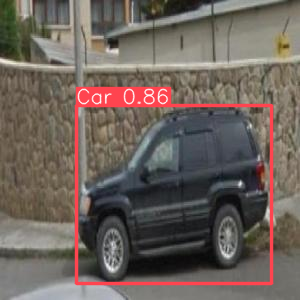

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


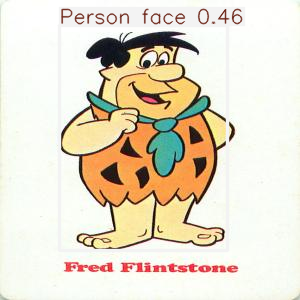

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


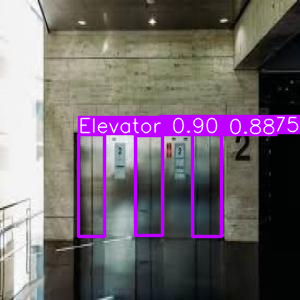

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


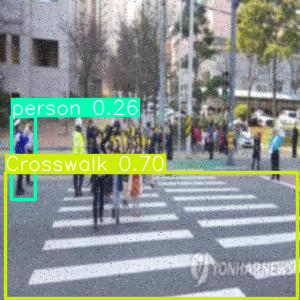

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


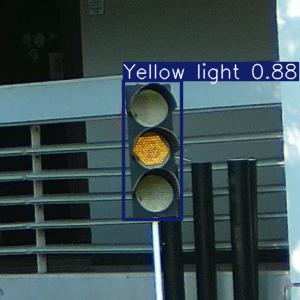

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


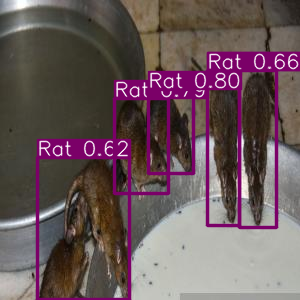

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


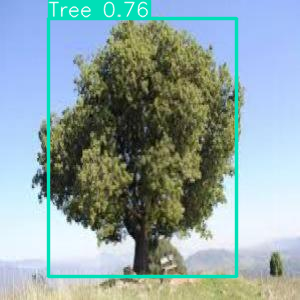

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


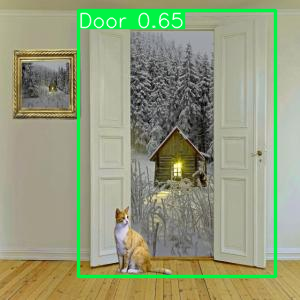

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


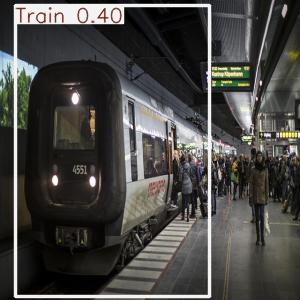

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


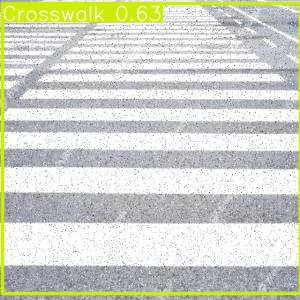

In [14]:
import torch
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# Load the YOLOv5 model
model_path = '/kaggle/input/object_detection25_yolov5m/pytorch/default/1/best.pt'  # Replace with your model path
model = torch.hub.load('ultralytics/yolov5', 'custom', path=model_path)

# Path to the test images directory
test_images_dir = '/kaggle/input/object-detection-of-26-objects/dataset_26/test/images'  # Replace with your test directory

# Select 5 images from the test directory
test_images = list(Path(test_images_dir).glob('*.jpg'))[:10]  # Adjust file type if needed

# Perform predictions and display results
for img_path in test_images:
    # Perform inference
    results = model(img_path)
    
    # Display results
    results.show()  # To show the detected image with bounding boxes

    # Alternatively, save the results
    # results.save(save_dir='/kaggle/working/detections')  # Save to detections directory

# Plot results if you want to display within the notebook
fig, axs = plt.subplots(1, 5, figsize=(20, 10))
for ax, img_path in zip(axs, test_images):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.axis('off')
plt.show()
